# FIFA Women's World Cup Stats - Data Analysis

### Table of Contents

<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#question">Research Question</a></li>
<li><a href="#data">Data Collection and Cleaning</a></li>
<li><a href="#uni">Univariate Analysis</a></li>
<li><a href="#bi">Bivariate Analysis</a></li>    
<li><a href="#eda">Exploratory Data Analysis</a></li>    
<li><a href="#sta">Statistical Analysis</a></li> 
<li><a href="#modelling">Predictive Modelling</a></li>     
</ul>


<a id='intro'></a>
## Introduction

The FIFA Women's World Cup is the premier international tournament in women's football, showcasing the best female players from around the world. Since its inception in 1991, it has grown in popularity, attracting millions of fans and viewers across the globe.

In this project, we will explore a FIFA Women's World Cup Stats dataset, which contains detailed information on the teams, matches, and results of the tournaments from 1991 to 2019. The dataset also provides information on the performance of teams, as well as insights into the evolution of women's football over the past few decades.

By analyzing this dataset, we hope to gain a better understanding of the trends and patterns that have emerged over the course of the Women's World Cup's history, as well as identify factors that contribute to success in this highly competitive tournament. 

<a id='question'></a>
## Research Question
##### What country is the queen of female FIFA football?
The primary research question for this project is **"What country is the queen of female FIFA football?"** In order to answer to answer this question, we will conduct an analysis on the FIFA Women's World Cup Stats dataset to identify the **top factors** that have been shown to contribute to a team's success. By identifying these five factors, we will be able to determine which country has been the most cuccessssful overall in women's FIFA football. 

<a id='data'></a>
## Data Collection and Cleaning

The dataset was obtained from Kaggle, a platform for hosting datasets and machine learning competitions. The dataset is provided by Matt Oppenheim, a data analyst and researcher, and contains statistics on all the teams, players, and matches in every Women's World Cup tournament from 1991 to 2019. 
Before beginning our analysis, we checked the data to ensure that it is accurate, complete, and free from errors.

#### Import required Libraries

In [42]:
# For Data Analysis
import pandas as pd
import numpy as np
from math import log10

# For Statistical Analysis
import statsmodels.api as sm
from statsmodels.formula.api import ols
from scipy.stats import ttest_ind, chi2_contingency, spearmanr, pearsonr
import statsmodels.api as sm

# For Data Visualization 
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (14, 6)
from matplotlib import cm
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import missingno as msno

# For Data Preprocessing
from sklearn.preprocessing import LabelEncoder, StandardScaler

# For Predictive Modelling
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.linear_model import LinearRegression

# For Styling
plt.style.use('default')

# Set seed for reproducibility
seed = 42

# For Warnings
import warnings
warnings.filterwarnings('ignore')

In [43]:
# read csv file of data
world_cup_df = pd.read_csv('womens-world-cup.csv', index_col = 'id')

In [44]:
# print first five rows of data
world_cup_df.head()

,squad,year,players,age,possesion,matches_played,starts,min_playing_time,minutes_played_90s,goals,...,non_penalty_goals,penalty_kicks_made,penalty_kicks_attempted,yellow_cards,red_cards,goals_per_90,assists_per_90,goals_plus_assists_per_90,goals_minus_penalty_kicks_per_90,goals_plus_assists_minus_penalty_kicks_per_90
id,,,,,,,,,,,,,,,,,,,,,
1,Argentina,2019,18,26.8,34.7,3,33,270,3.0,2,...,1,1,1,3.0,0.0,0.67,0.33,1.00,0.33,0.67
2,Australia,2019,18,25.4,61.3,4,44,390,4.3,8,...,8,0,1,2.0,0.0,1.85,0.92,2.77,1.85,2.77
3,Brazil,2019,18,29.7,51.5,4,44,390,4.3,7,...,5,2,3,7.0,0.0,1.62,0.69,2.31,1.15,1.85
4,Cameroon,2019,20,27.7,36.0,4,44,360,4.0,3,...,3,0,0,6.0,0.0,0.75,0.75,1.50,0.75,1.50
5,Canada,2019,16,27.0,63.0,4,44,360,4.0,4,...,4,0,1,2.0,0.0,1.00,0.75,1.75,1.00,1.75


In [45]:
# print shape of data
world_cup_df.shape

(136, 21)

*The dataset contains 136 rows and 21 columns*

In [46]:
# view columns of data
world_cup_df.columns

Index(['squad', 'year', 'players', 'age', 'possesion', 'matches_played',
       'starts', 'min_playing_time', 'minutes_played_90s', 'goals', 'assists',
       'non_penalty_goals', 'penalty_kicks_made', 'penalty_kicks_attempted',
       'yellow_cards', 'red_cards', 'goals_per_90', 'assists_per_90',
       'goals_plus_assists_per_90', 'goals_minus_penalty_kicks_per_90',
       'goals_plus_assists_minus_penalty_kicks_per_90'],
      dtype='object')

In [47]:
# print information of data
world_cup_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 136 entries, 1 to 136
Data columns (total 21 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   squad                                          136 non-null    object 
 1   year                                           136 non-null    int64  
 2   players                                        136 non-null    int64  
 3   age                                            136 non-null    float64
 4   possesion                                      96 non-null     float64
 5   matches_played                                 136 non-null    int64  
 6   starts                                         136 non-null    int64  
 7   min_playing_time                               136 non-null    int64  
 8   minutes_played_90s                             136 non-null    float64
 9   goals                                          136 non

+ About 95% of the columns in dataset are numeric and there is just one categorical column
+ We may have to change the datatype of the year column to be able to use it effectively in our analysis

In [48]:
# View the number of unique values in the data
world_cup_df.nunique() 

squad                                            36
year                                              8
players                                          11
age                                              62
possesion                                        74
matches_played                                    5
starts                                            5
min_playing_time                                 17
minutes_played_90s                               17
goals                                            22
assists                                          15
non_penalty_goals                                22
penalty_kicks_made                                5
penalty_kicks_attempted                           5
yellow_cards                                      9
red_cards                                         2
goals_per_90                                     50
assists_per_90                                   40
goals_plus_assists_per_90                        61
goals_minus_

In [49]:
# Check if the data has any duplicated values
world_cup_df.duplicated().sum()

0

_There are no duplicated values in the dataset_

In [50]:
world_cup_df.describe()

,year,players,age,possesion,matches_played,starts,min_playing_time,minutes_played_90s,goals,assists,non_penalty_goals,penalty_kicks_made,penalty_kicks_attempted,yellow_cards,red_cards,goals_per_90,assists_per_90,goals_plus_assists_per_90,goals_minus_penalty_kicks_per_90,goals_plus_assists_minus_penalty_kicks_per_90
count,136.000000,136.000000,136.000000,96.000000,136.000000,136.000000,136.000000,136.000000,136.000000,136.000000,136.000000,136.000000,136.000000,62.000000,62.000000,136.000000,136.000000,136.000000,136.000000,136.000000
mean,2007.117647,17.330882,25.274265,49.252083,4.176471,45.941176,378.147059,4.200735,6.566176,3.154412,6.161765,0.404412,0.463235,2.483871,0.080645,1.375735,0.651324,2.027574,1.294265,1.946397
std,9.159540,1.712936,1.962462,6.584783,1.298902,14.287920,122.916565,1.361780,5.764132,3.612486,5.528674,0.754038,0.859872,2.434331,0.274512,0.923320,0.633787,1.405935,0.898872,1.365997
min,1991.000000,13.000000,18.200000,30.000000,3.000000,33.000000,240.000000,2.700000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1999.000000,16.000000,24.275000,46.275000,3.000000,33.000000,270.000000,3.000000,2.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.670000,0.000000,1.000000,0.600000,0.787500
50%,2007.000000,17.000000,25.300000,49.400000,4.000000,44.000000,360.000000,4.000000,5.000000,2.000000,4.500000,0.000000,0.000000,2.000000,0.000000,1.250000,0.500000,1.750000,1.075000,1.725000
75%,2015.000000,18.000000,26.800000,53.350000,5.000000,55.000000,480.000000,5.300000,10.000000,5.000000,9.000000,1.000000,1.000000,4.000000,0.000000,1.947500,1.000000,3.000000,1.800000,3.000000
max,2019.000000,23.000000,29.700000,63.000000,7.000000,77.000000,690.000000,7.700000,25.000000,17.000000,25.000000,4.000000,4.000000,8.000000,1.000000,4.690000,2.430000,6.750000,4.500000,6.560000


In [51]:
# View percentage of missing values in each column in the data
missing_percentage = round(world_cup_df.isna().sum() * 100 / world_cup_df.shape[0], 3).sort_values() 
missing_percentage

squad                                             0.000
goals_plus_assists_per_90                         0.000
assists_per_90                                    0.000
goals_per_90                                      0.000
penalty_kicks_attempted                           0.000
penalty_kicks_made                                0.000
non_penalty_goals                                 0.000
goals_minus_penalty_kicks_per_90                  0.000
goals                                             0.000
assists                                           0.000
min_playing_time                                  0.000
starts                                            0.000
matches_played                                    0.000
age                                               0.000
players                                           0.000
year                                              0.000
minutes_played_90s                                0.000
goals_plus_assists_minus_penalty_kicks_per_90   

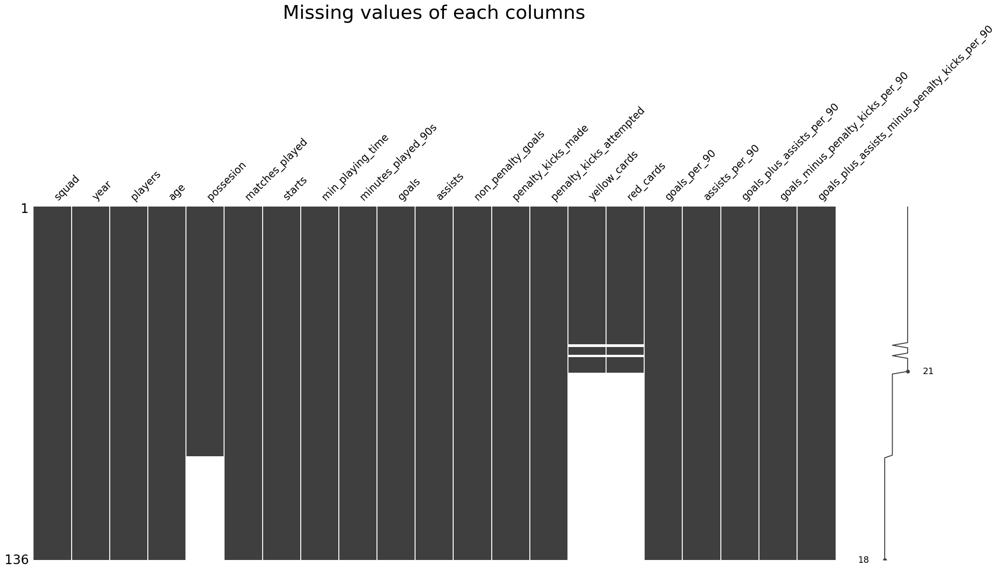

In [52]:
# Make a missingno plot the visualize the missing data in the data
msno.matrix(world_cup_df)
plt.title('Missing values of each columns', fontsize = 30);

+ About 29% of the values in the possesion column and about 54% of the values in the yellow_cards and red_cards column are missing_

### Explore Missing Data Columns

##### Possesion

In [53]:
# print years where ball possesion value is not null
world_cup_df[world_cup_df['possesion'].isnull() == False]['year'].unique()

array([2019, 2015, 2011, 2007, 2003], dtype=int64)

In [54]:
# print years where ball possesion value is null
world_cup_df[world_cup_df['possesion'].isnull()]['year'].unique()

array([1999, 1995, 1991], dtype=int64)

+ Ball Possession was not documented until the 2003 female fifa world cup match
+ The missing Ball Possession values can be filled with 0 

##### Red Cards and Yellow Cards

In [55]:
# check if the same rows that red_cards values are missing that yellow_cards values are missing
missing_red_cards_indexes = set(world_cup_df[world_cup_df['red_cards'].isnull() == True].index)

missing_yellow_cards_indexes = set(world_cup_df[world_cup_df['yellow_cards'].isnull() == True].index)

if missing_red_cards_indexes == missing_yellow_cards_indexes:
    print('The same rows that red_cards values are missing, yellow_cards values are also missing')
else:
    print("It's not the same")

The same rows that red_cards values are missing, yellow_cards values are also missing


In [56]:
# Sum up the total number red_cards and yellow cards
world_cup_df['offence'] = world_cup_df['red_cards'] + world_cup_df['yellow_cards']

In [57]:
# Print years where offence value is not null
world_cup_df[world_cup_df['offence'].isnull() == False]['year'].unique()

array([2019, 2015, 2011], dtype=int64)

In [58]:
# Print years where offence value is null
world_cup_df[world_cup_df['offence'].isnull() == True]['year'].unique()

array([2011, 2007, 2003, 1999, 1995, 1991], dtype=int64)

In [59]:
# Confirm if offence valuez from 2011 were recorded
world_cup_df[world_cup_df['year'] == 2011]['offence']

id
49    0.0
50    0.0
51    0.0
52    0.0
53    0.0
54    NaN
55    0.0
56    0.0
57    0.0
58    NaN
59    0.0
60    0.0
61    0.0
62    0.0
63    0.0
64    0.0
Name: offence, dtype: float64

+ Red Card and Yellow Card counts were only documented in the 2015 and 2019 FIFA World Cup Match
+ The missing Offence values can be filled with 0 

<a id='uni'></a>
## Univariate Analysis

In this section we conducted a preliminary analysis of each variable in the dataset. This involved:
* Calculating summary statistics such as mean, median, and standard deviation, and creating density plots and box plots to visualize the distribution of each numeric variable.
* Printing the unique values, the number of unique values and creating bar plots to visualize the distribution of each categorical variable. 


---------------- Squad ----------------
Number of Unique Values: 36
Unique Values: ['Argentina', 'Australia', 'Brazil', 'Cameroon', 'Canada', 'Chile', 'China PR', 'England', 'France', 'Germany', 'Italy', 'Jamaica', 'Japan', 'Korea Rep', 'Netherlands', 'New Zealand', 'Nigeria', 'Norway', 'Scotland', 'South Africa', 'Spain', 'Sweden', 'Thailand', 'USA', 'Colombia', 'Costa Rica', "Côte d'Ivoire", 'Ecuador', 'Mexico', 'Switzerland', 'Equ. Guinea', 'Korea DPR', 'Denmark', 'Ghana', 'Russia', 'Chinese Taipei']


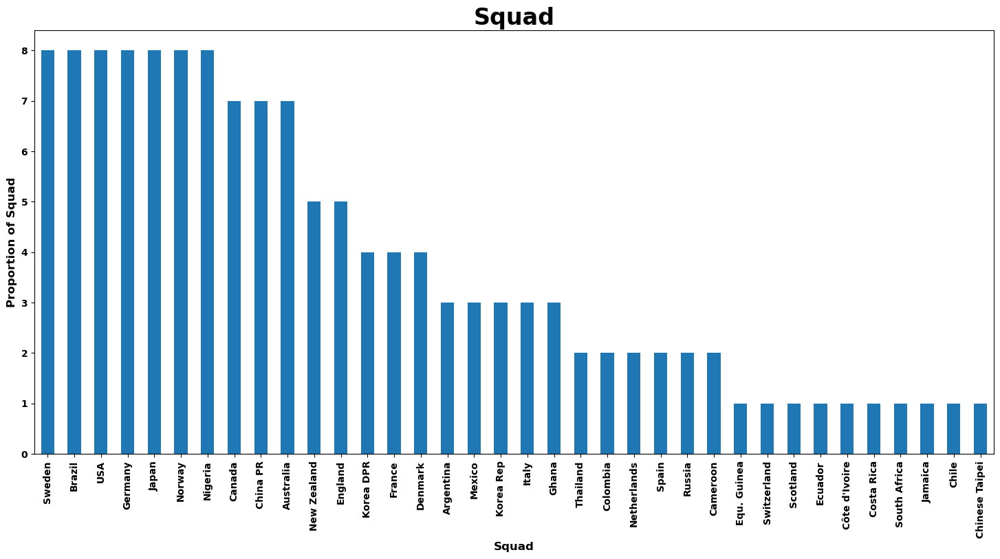

In [60]:
# function to explore and visualize all the categorical columns
def explore_categorical_variables(data):
    # Define the list of variables to analyze
    variables = [column for column in world_cup_df.columns if world_cup_df[column].dtypes == 'object']    
    
    """Loop over each variable and generate summary statistics and plots""" 
    for variable in variables:
        # Rewrite column name
        label = " ".join([word.capitalize() for word in variable.split('_')])
        
        # Compute summary statistics
        print(f"\n---------------- {label} ----------------")
        print(f"Number of Unique Values: {data[variable].nunique()}")
        print(f"Unique Values: {list(data[variable].unique())}")
        

        plt.figure(figsize = (18, 8)) 
        data[variable].value_counts().plot(kind = "bar")
        plt.xlabel(label, size = 12, fontweight = 'bold')
        plt.xticks(fontweight = "bold")
        plt.yticks(fontweight = "bold")
        plt.ylabel(f"Proportion of {label}", size = 12, fontweight = 'bold')
        plt.title(label, size = 24, fontweight = 'bold')
        
        plt.show()   

explore_categorical_variables(world_cup_df)

+ Sweden, Brazil, USA, Germany, Japan, Norway and Nigeria appear played in all the tournaments
+ 2019 and 2015 tournaments had the highest number of teams


---------------- Year ----------------
Minimum value: 1991
Maximum value: 2019
Mean: 2007.1176470588234
Standard deviation: 9.159539713107396


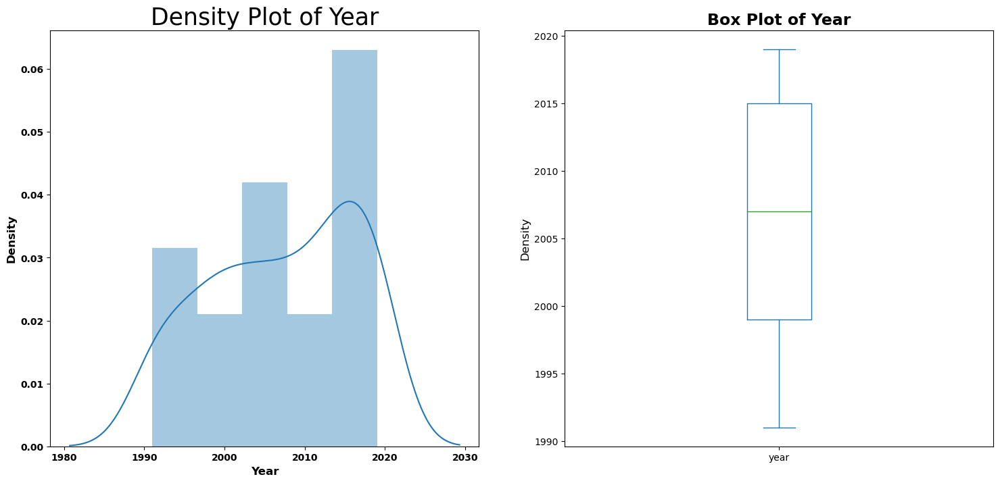


---------------- Players ----------------
Minimum value: 13
Maximum value: 23
Mean: 17.330882352941178
Standard deviation: 1.712936171256064


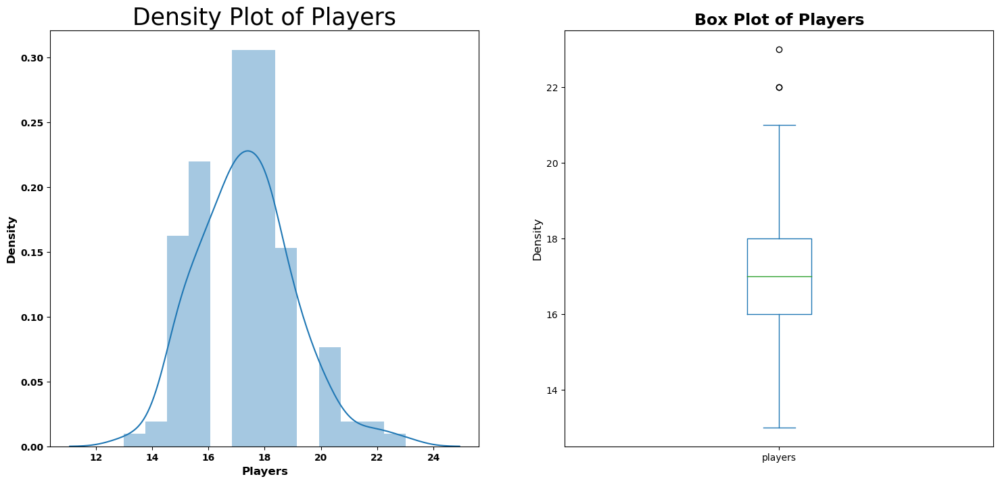


---------------- Age ----------------
Minimum value: 18.2
Maximum value: 29.7
Mean: 25.27426470588235
Standard deviation: 1.9624624110022977


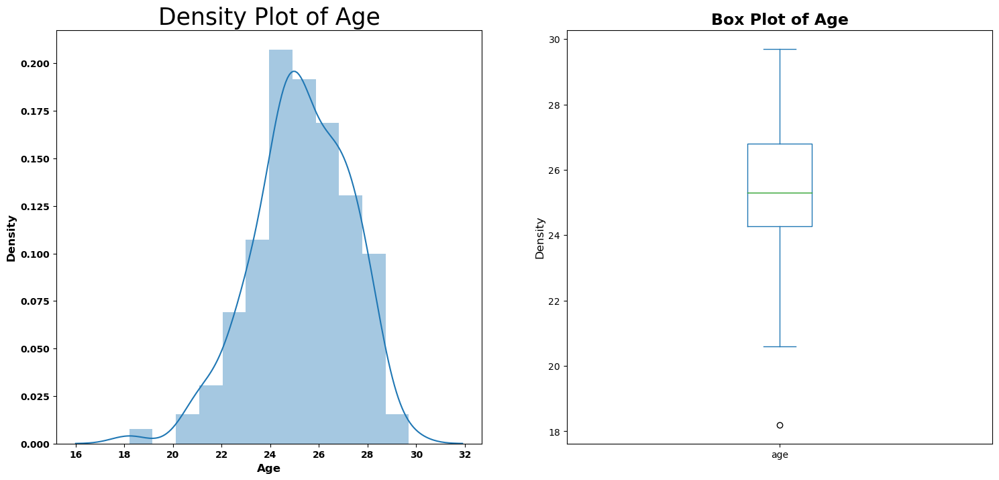


---------------- Possesion ----------------
Minimum value: 30.0
Maximum value: 63.0
Mean: 49.25208333333334
Standard deviation: 6.584782762938177


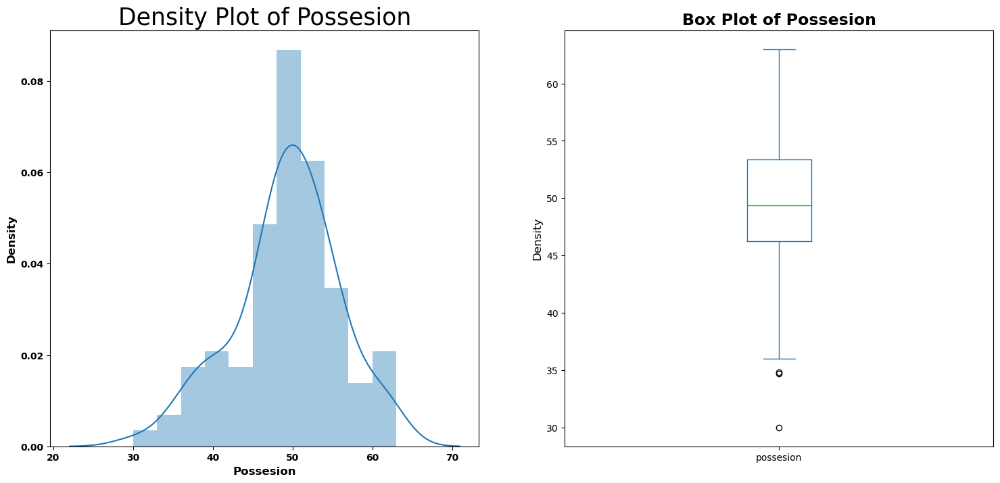


---------------- Matches Played ----------------
Minimum value: 3
Maximum value: 7
Mean: 4.176470588235294
Standard deviation: 1.298901832125474


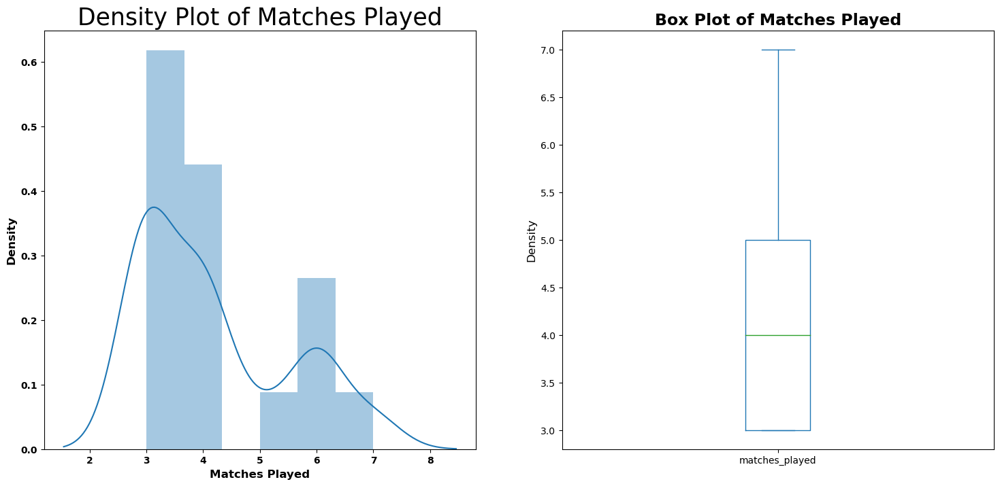


---------------- Starts ----------------
Minimum value: 33
Maximum value: 77
Mean: 45.94117647058823
Standard deviation: 14.287920153380197


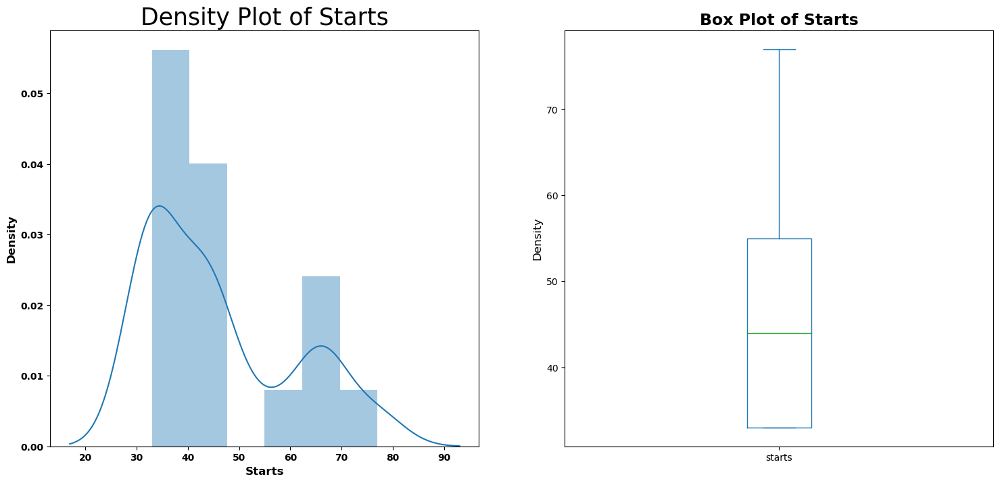


---------------- Min Playing Time ----------------
Minimum value: 240
Maximum value: 690
Mean: 378.1470588235294
Standard deviation: 122.9165648609305


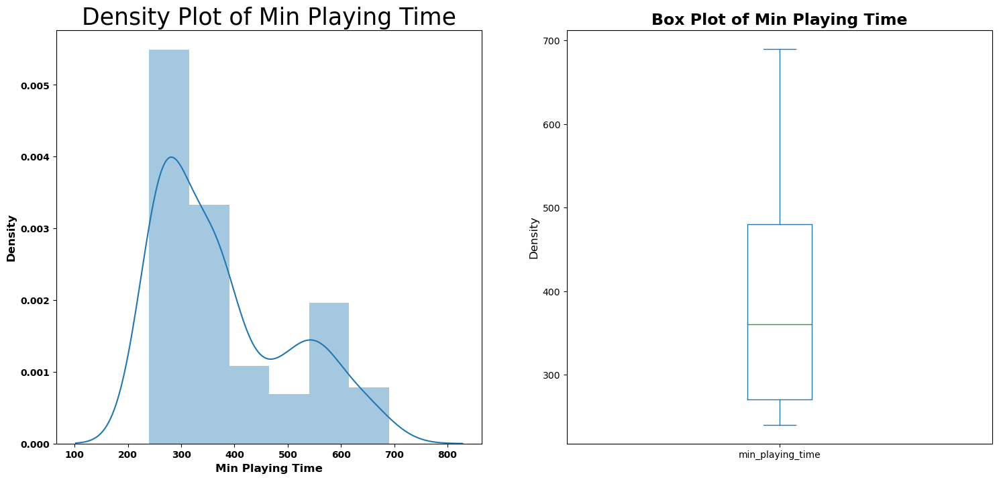


---------------- Minutes Played 90s ----------------
Minimum value: 2.7
Maximum value: 7.7
Mean: 4.200735294117648
Standard deviation: 1.36177968107258


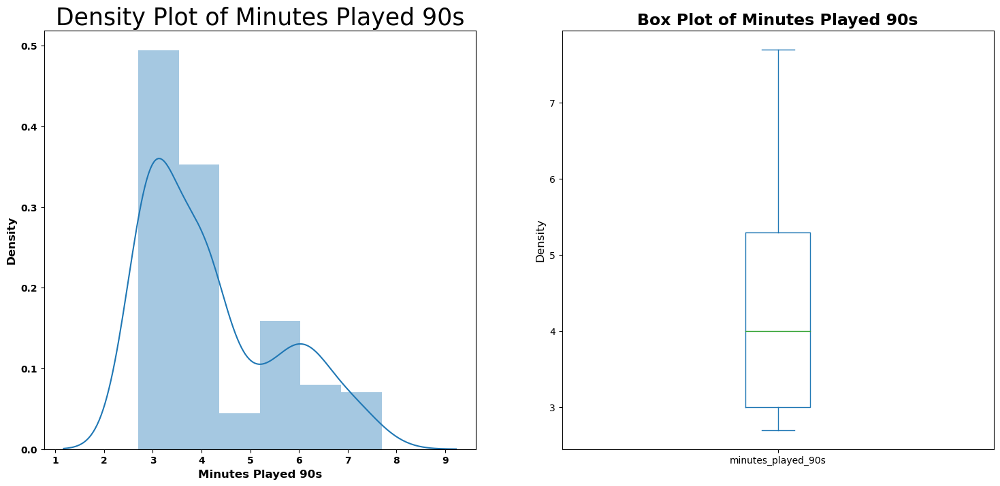


---------------- Goals ----------------
Minimum value: 0
Maximum value: 25
Mean: 6.5661764705882355
Standard deviation: 5.764132013141591


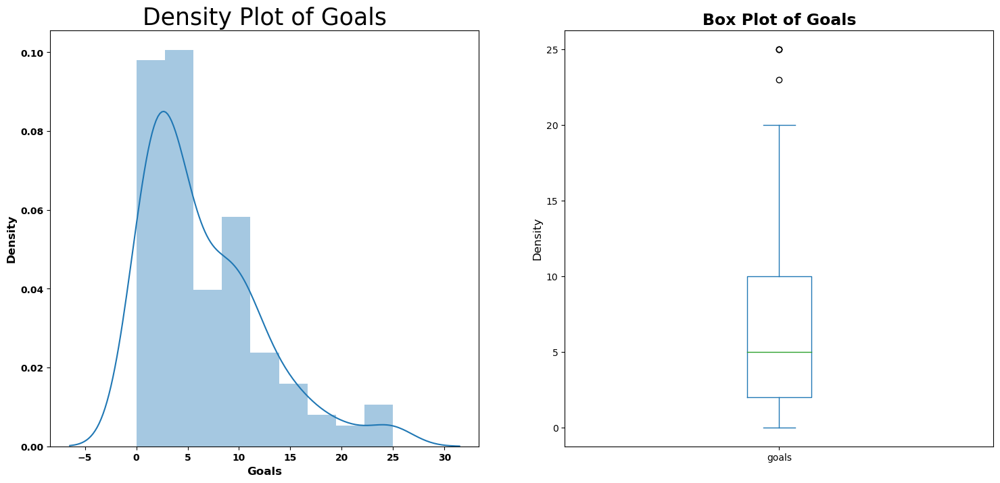


---------------- Assists ----------------
Minimum value: 0
Maximum value: 17
Mean: 3.1544117647058822
Standard deviation: 3.61248591225363


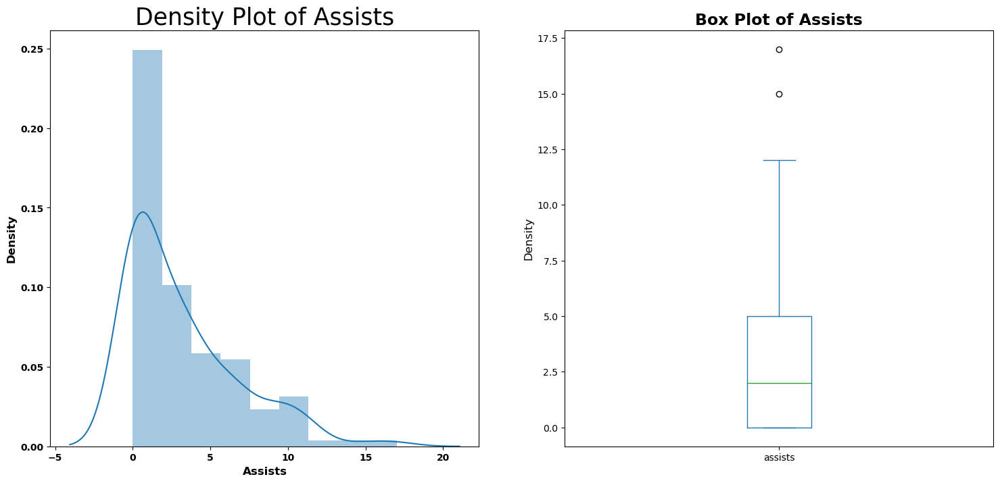


---------------- Non Penalty Goals ----------------
Minimum value: 0
Maximum value: 25
Mean: 6.161764705882353
Standard deviation: 5.528673524166459


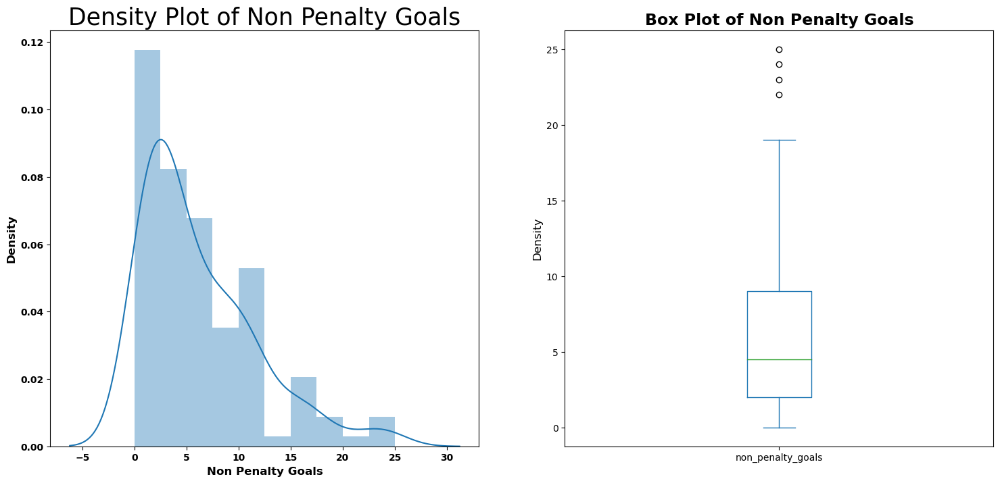


---------------- Penalty Kicks Made ----------------
Minimum value: 0
Maximum value: 4
Mean: 0.40441176470588236
Standard deviation: 0.754037787348522


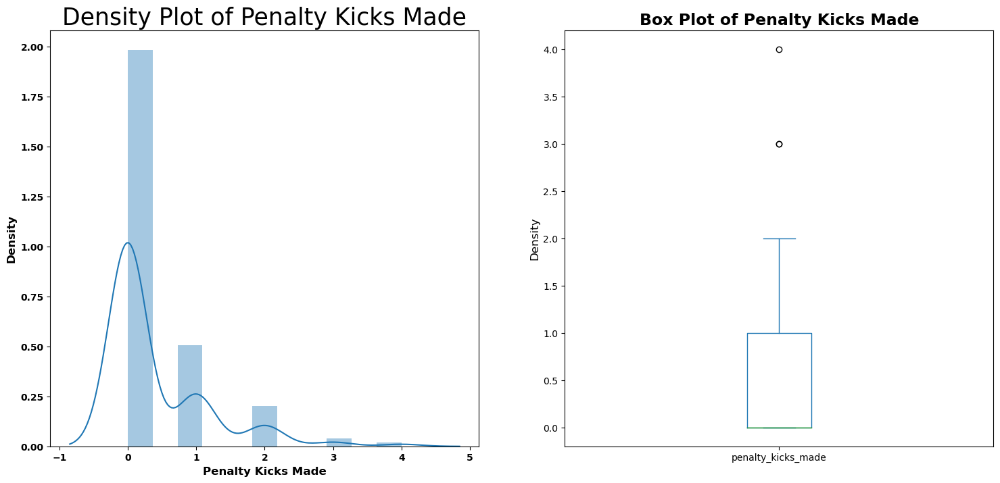


---------------- Penalty Kicks Attempted ----------------
Minimum value: 0
Maximum value: 4
Mean: 0.4632352941176471
Standard deviation: 0.8598715514350501


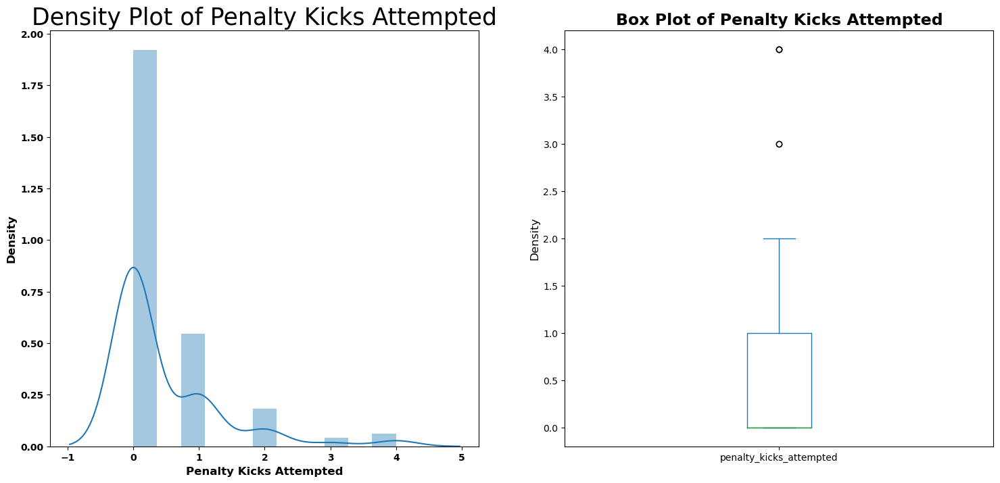


---------------- Yellow Cards ----------------
Minimum value: 0.0
Maximum value: 8.0
Mean: 2.4838709677419355
Standard deviation: 2.434330523538626


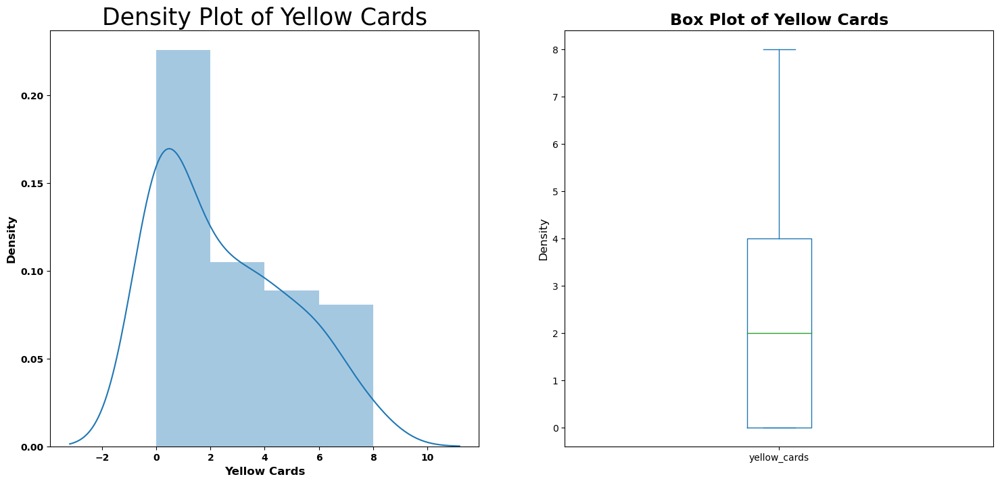


---------------- Red Cards ----------------
Minimum value: 0.0
Maximum value: 1.0
Mean: 0.08064516129032258
Standard deviation: 0.27451221100817447


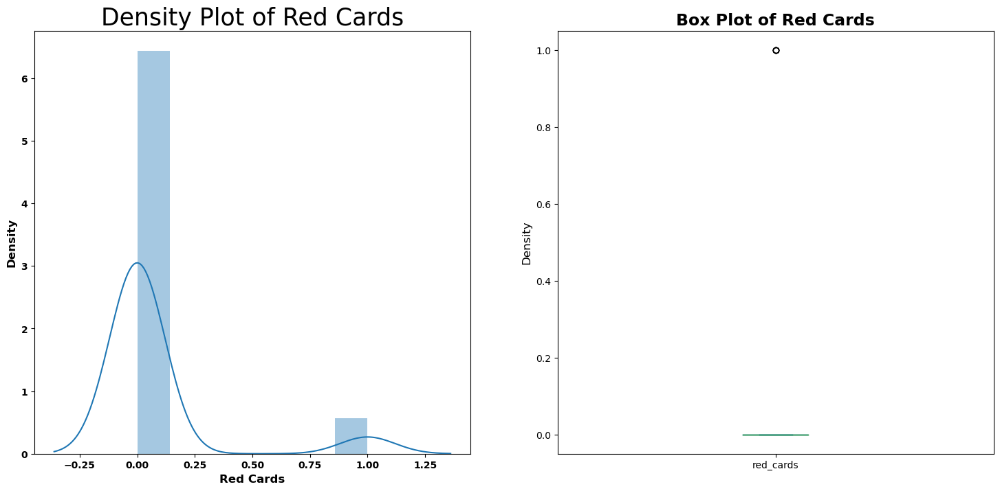


---------------- Goals Per 90 ----------------
Minimum value: 0.0
Maximum value: 4.69
Mean: 1.3757352941176475
Standard deviation: 0.9233198012269045


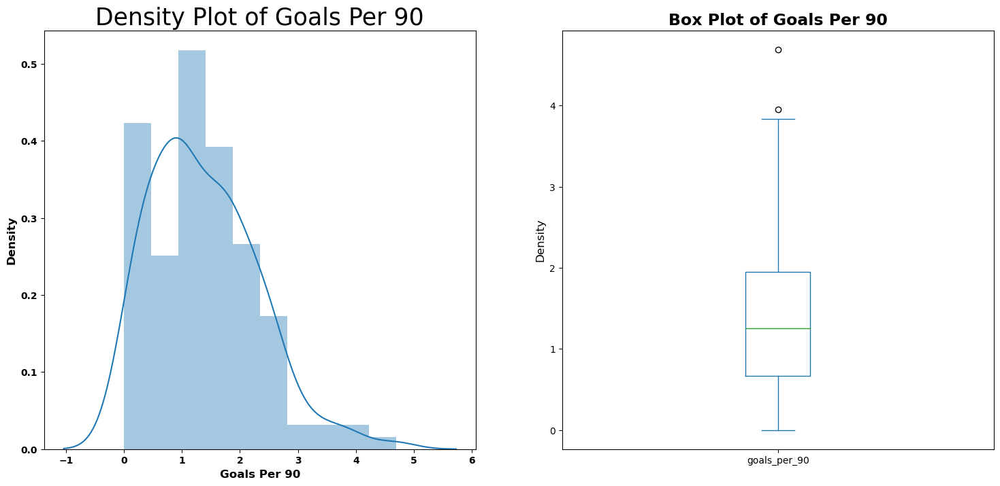


---------------- Assists Per 90 ----------------
Minimum value: 0.0
Maximum value: 2.43
Mean: 0.6513235294117647
Standard deviation: 0.6337867486004457


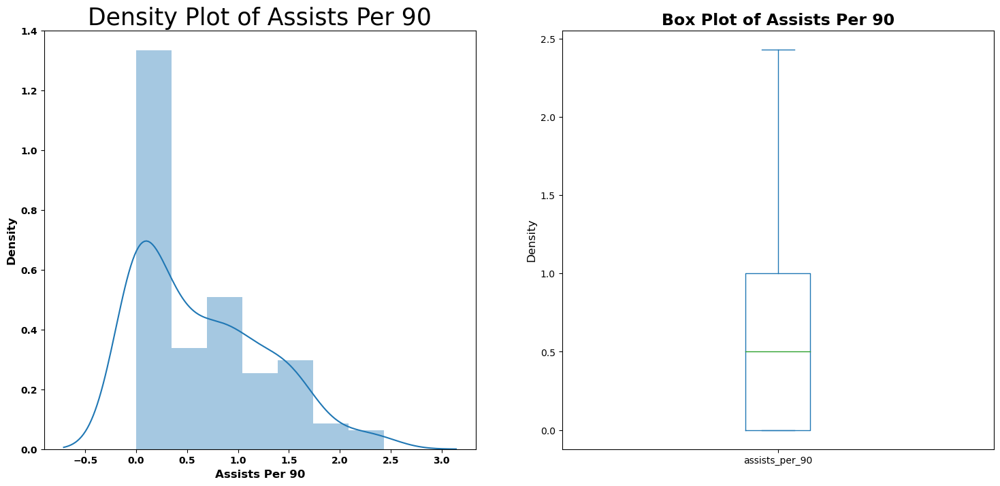


---------------- Goals Plus Assists Per 90 ----------------
Minimum value: 0.0
Maximum value: 6.75
Mean: 2.0275735294117645
Standard deviation: 1.4059347734322423


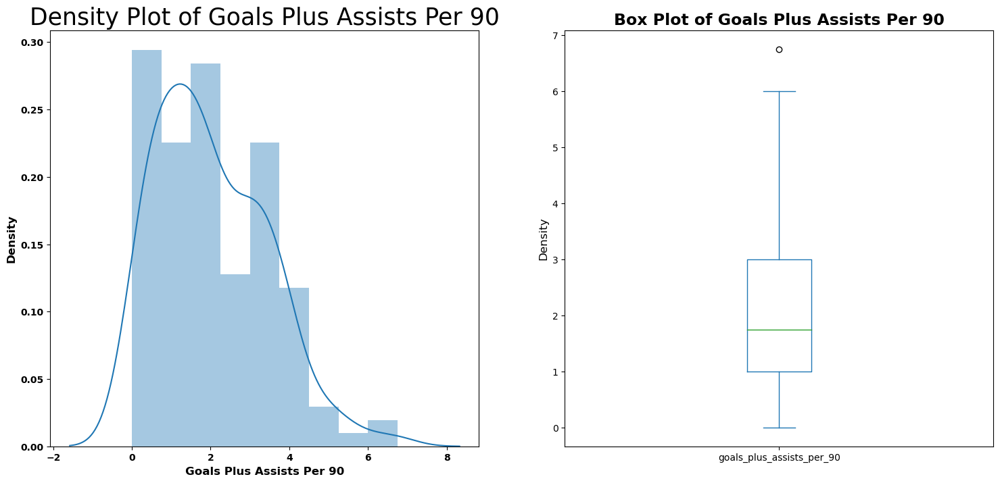


---------------- Goals Minus Penalty Kicks Per 90 ----------------
Minimum value: 0.0
Maximum value: 4.5
Mean: 1.2942647058823529
Standard deviation: 0.8988722418617356


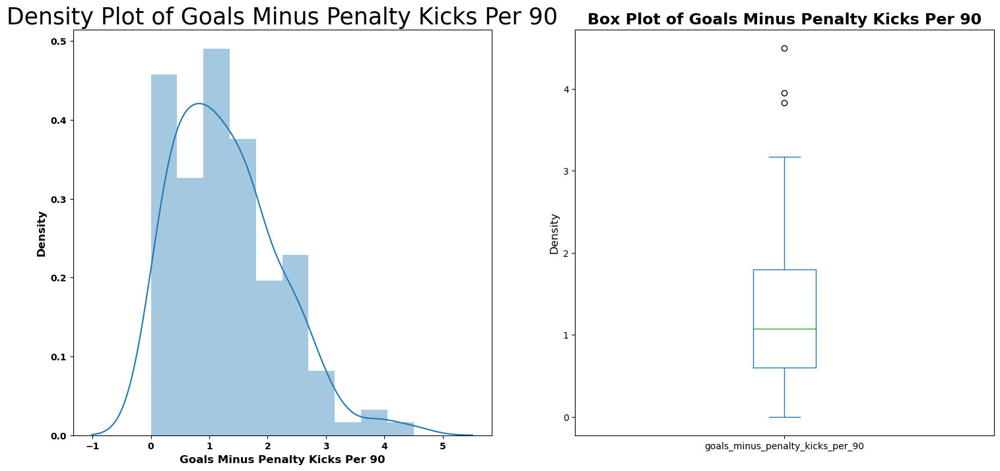


---------------- Goals Plus Assists Minus Penalty Kicks Per 90 ----------------
Minimum value: 0.0
Maximum value: 6.56
Mean: 1.9463970588235298
Standard deviation: 1.36599749080303


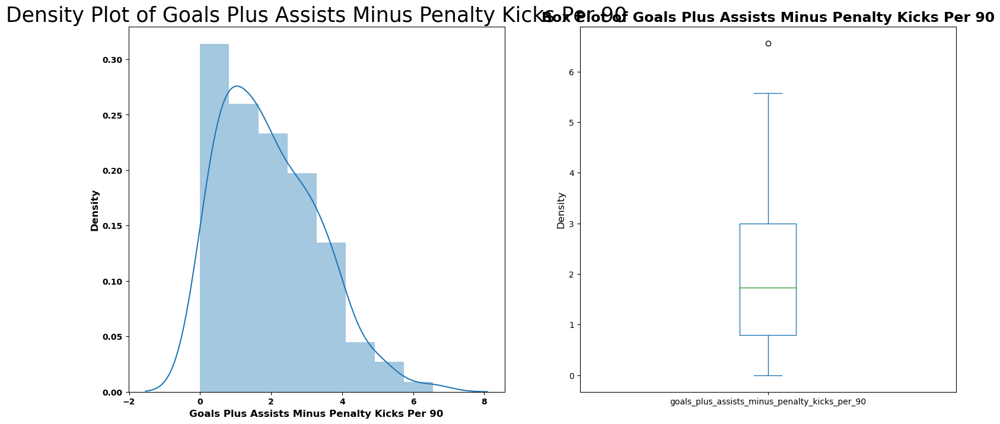


---------------- Offence ----------------
Minimum value: 0.0
Maximum value: 8.0
Mean: 2.564516129032258
Standard deviation: 2.539013411995488


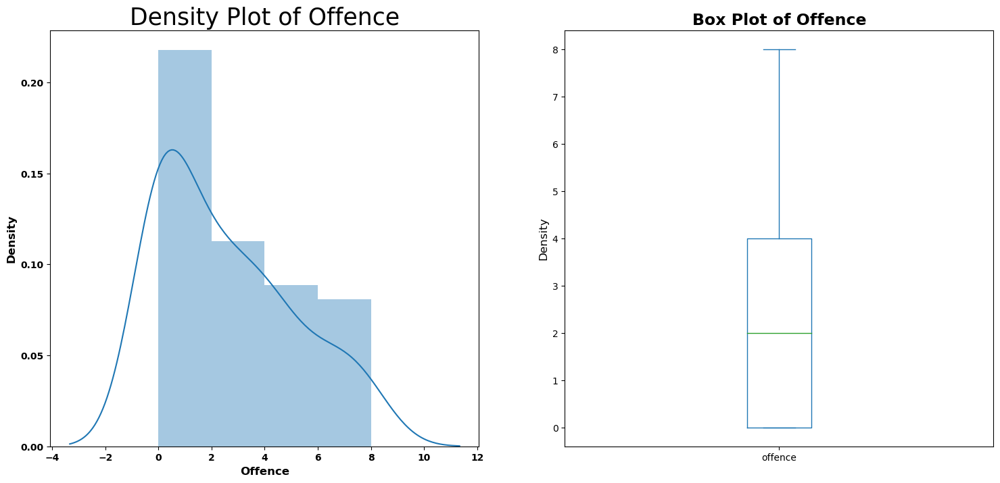

In [61]:
# function to explore and visualize all the numerical columns
def explore_numeric_variables(data):
    # Define the list of variables to analyze
    variables = [column for column in world_cup_df.columns if world_cup_df[column].dtypes != 'object']    
    
    """Loop over each variable and generate summary statistics and plots""" 
    for variable in variables:
        # Rewrite column name
        label = " ".join([word.capitalize() for word in variable.split('_')])
        
        # Compute summary statistics
        print(f"\n---------------- {label} ----------------")
        print(f"Minimum value: {data[variable].min()}")
        print(f"Maximum value: {data[variable].max()}")
        print(f"Mean: {data[variable].mean()}")
        print(f"Standard deviation: {data[variable].std()}")
        
        # Generate density plot and box plot  
        plt.figure(1)
        plt.subplot(121)
        sns.distplot(data[variable]);
        plt.ylabel('Density', fontsize = 12, fontweight = "bold")
        plt.xlabel(label, fontsize = 12, fontweight = "bold")
        plt.xticks(fontweight = "bold")
        plt.yticks(fontweight = "bold")
        plt.title('Density Plot of ' + label, fontsize = 25, loc = 'center')
        
        plt.subplot(122)
        data[variable].plot.box(figsize = (18, 8));
        plt.ylabel('Density', fontsize = 12)
        plt.title('Box Plot of ' + label, fontsize = 17, loc = 'center', fontweight = "bold")
        
        plt.show() 

explore_numeric_variables(world_cup_df)

+ Most numeric variables in the dataset are normally distributed.  

<a id='bi'></a>
## Bivariate Analysis
Here we analyzed the relationship between pairs of variables in the dataset. We did this by by creating scatter plots, correlation matrices, and other visualizations that show how the variables are related to each other.

In [62]:
# create a new column - penalty conversion rate
world_cup_df['penalty_conversion_rate'] = world_cup_df['penalty_kicks_made'] / world_cup_df['penalty_kicks_attempted']

In [63]:
# create scatter plots to show how variables in the dataset relate to the number of goals scored
variables = [column for column in world_cup_df.columns if world_cup_df[column].dtypes != 'object'] 

for variable in variables:
    # Rewrite column name
    label = " ".join([word.capitalize() for word in variable.split('_')])
    if variable is not 'goals':
        fig = px.scatter(world_cup_df, x = 'goals', y = variable, color = 'squad')

        fig.update_layout(
            
           title = "No. of Goals Scored vs. " + label,
           xaxis_title = "No. of Goals Scored",
           yaxis_title = label,
           legend_title = "Country",
      
           font_family = "Times New Roman",
            
           font = dict(
               size = 16)
        )
        fig.update_xaxes(title_font_family = "Times New Roman")
        fig.show()

In [64]:
# create joint plots to show how variables in the dataset relate to the number of goals scored
variables = [column for column in world_cup_df.columns if world_cup_df[column].dtypes != 'object'] 

for variable in variables:
    # Rewrite column name
    label = " ".join([word.capitalize() for word in variable.split('_')])
    if variable is not 'goals':
        fig = px.scatter(world_cup_df, x = 'goals', y = variable, color = 'squad', marginal_x = "histogram", marginal_y = "histogram")

        fig.update_layout(
            
           title = "No. of Goals Scored vs. " + label,
           xaxis_title = "No. of Goals Scored",
           yaxis_title = label,
           legend_title = "Country",
      
           font_family = "Times New Roman",
           
            
           font = dict(
               size = 16)
        )
        fig.update_xaxes(title_font_family = "Times New Roman")
        fig.show()

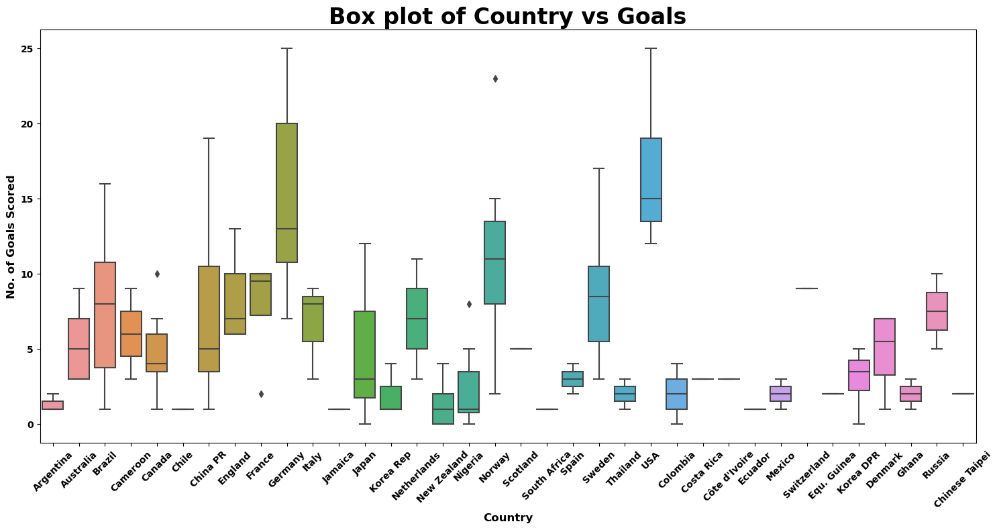

In [90]:
# Box plot of county vs goals
plt.figure(figsize = (18, 8)) 
sns.boxplot(x='squad', y='goals', data=world_cup_df)
plt.xticks(fontweight = "bold", rotation = 45 )
plt.yticks(fontweight = "bold")
plt.xlabel('Country', size = 12, fontweight = 'bold')
plt.ylabel('No. of Goals Scored', size = 12, fontweight = 'bold')
plt.title('Box plot of Country vs Goals', size = 24, fontweight = 'bold')
plt.show()

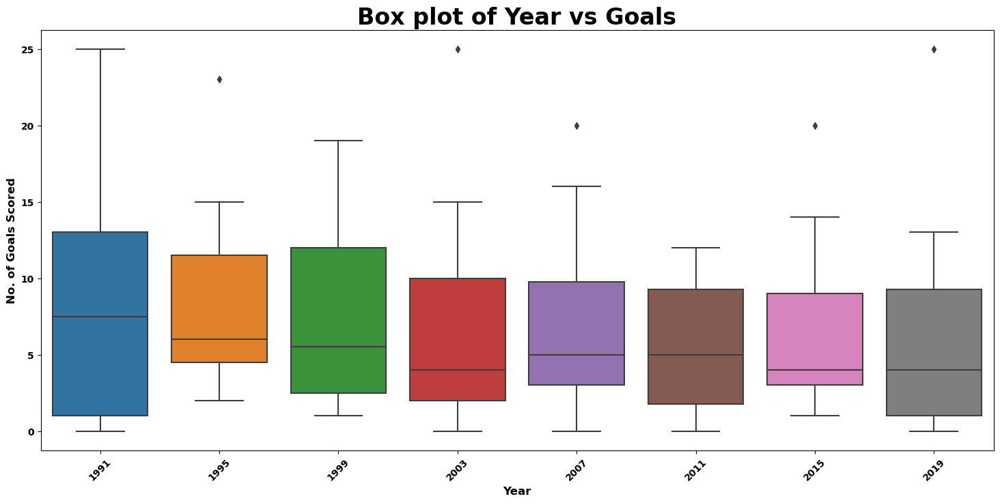

In [89]:
# Box plot of year vs goals
plt.figure(figsize = (18, 8)) 
sns.boxplot(x='year', y='goals', data=world_cup_df)
plt.xticks(fontweight = "bold", rotation = 45 )
plt.yticks(fontweight = "bold")
plt.xlabel('Year', size = 12, fontweight = 'bold')
plt.ylabel('No. of Goals Scored', size = 12, fontweight = 'bold')
plt.title('Box plot of Year vs Goals', size = 24, fontweight = 'bold')
plt.show()

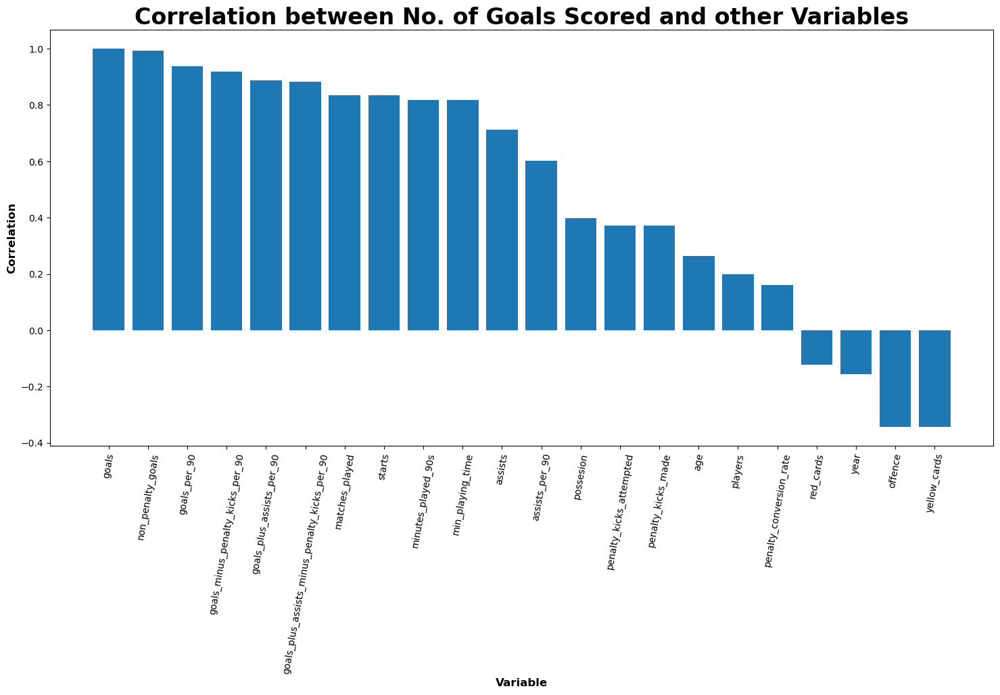

In [67]:
# Correlation between No. of Goals Scored and other Variables

goals_corr_df = pd.DataFrame(world_cup_df.corr()['goals'].sort_values(ascending = False)).rename(columns = {'goals':'corr'})

plt.figure(figsize = (18, 8)) 
plt.bar(goals_corr_df.index, goals_corr_df['corr'])
plt.xlabel("Variable", size = 12, fontweight = 'bold')
plt.xticks(rotation = 80)
plt.yticks()
plt.ylabel("Correlation", size = 12, fontweight = 'bold')
plt.title("Correlation between No. of Goals Scored and other Variables", size = 24, fontweight = 'bold')
        
plt.show() 

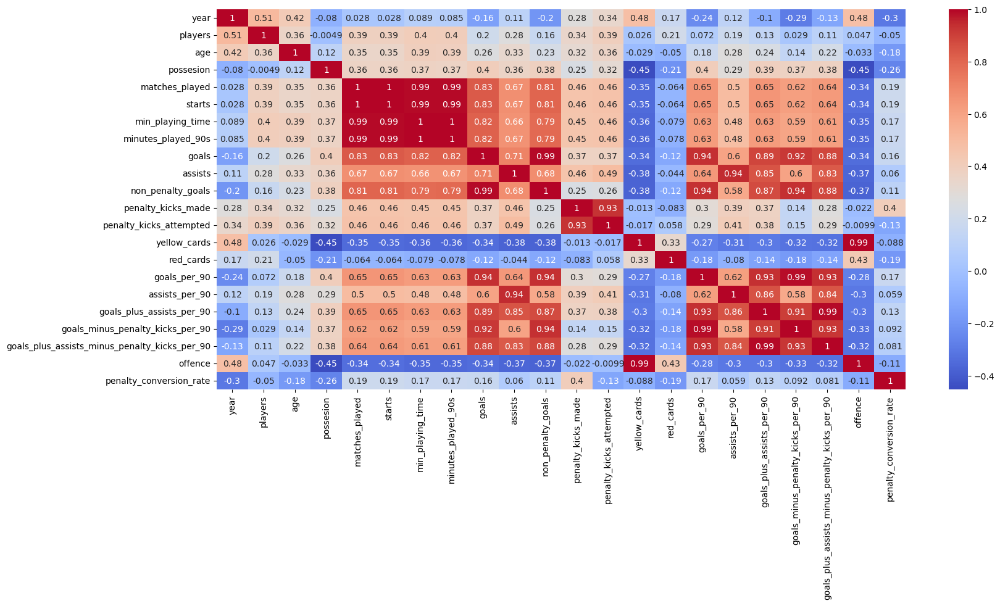

In [68]:
# Compute the correlation matrix of variables in the dataset
corr = world_cup_df.corr()

# Visualize the correlation matrix as a heatmap
plt.figure(figsize = (18, 8)) 
sns.heatmap(corr, annot=True, cmap='coolwarm');

<a id='eda'></a>
## Exploratory Data Analysis

In this section, we will ask some questions that can help answer the research question and use various data visualization techniques to answer these questions. The goal of this section is to gain a deeper understanding of the underlying structure of the data.

##### What is the distribution of possession percentages across all teams?


In [69]:
# Distribution of possession percentages across all teams

team_list = list(world_cup_df['squad'])

fig = px.histogram(world_cup_df[world_cup_df['squad'].isin(team_list)], x = 'possesion', nbins = 10, color = 'squad')
                   
fig.update_layout(
    title = "Distribution of Possesion Percentages",
    xaxis_title = "Possesion",
    yaxis_title = "Count",
    legend_title = "Teams",
    
    font_family = "Times New Roman",
            font = dict(
                size = 16)
         )
fig.update_xaxes(title_font_family = "Times New Roman")
fig.show()

##### What is the distribution of the number of goals scored by each team?

In [70]:
# Distribution of the number of goals scored by each team

team_list = list(world_cup_df['squad'])

fig = px.histogram(world_cup_df[world_cup_df['squad'].isin(team_list)], x = 'goals', nbins = 10, color = 'squad')
                   
fig.update_layout(
    title = "Distribution of the No. of Goals Scored",
    xaxis_title = "No. of Goals Scored",
    yaxis_title = "Count",
    legend_title = "Teams",
    
    font_family = "Times New Roman",
            font = dict(
                size = 16)
         )
fig.update_xaxes(title_font_family = "Times New Roman")
fig.show()

##### What is the distribution of the number of assists made by each team?


In [71]:
# Distribution of the number of assists made by each team

team_list = list(world_cup_df['squad'])

fig = px.histogram(world_cup_df[world_cup_df['squad'].isin(team_list)], x = 'assists', nbins = 10, color = 'squad')
                   
fig.update_layout(
    title = "Distribution of the No. of Assists Made",
    xaxis_title = "Assists",
    yaxis_title = "Count",
    legend_title = "Teams",
    
    font_family = "Times New Roman",
            font = dict(
                size = 16)
         )
fig.update_xaxes(title_font_family = "Times New Roman")
fig.show()

##### What is the distribution of yellow and red cards received by each team?


In [72]:
# Distribution of the number of yellow cards received by each team

team_list = list(world_cup_df['squad'])

fig = px.histogram(world_cup_df[world_cup_df['squad'].isin(team_list)], x = 'yellow_cards', nbins = 10, color = 'squad')
                   
fig.update_layout(
    title = "Distribution of the No. of Yellow Cards",
    xaxis_title = "Yellow Cards",
    yaxis_title = "Count",
    legend_title = "Teams",
    
    font_family = "Times New Roman",
            font = dict(
                size = 16)
         )
fig.update_xaxes(title_font_family = "Times New Roman")
fig.show()



# Distribution of the number of red cards received by each team

team_list = list(world_cup_df['squad'])

fig = px.histogram(world_cup_df[world_cup_df['squad'].isin(team_list)], x = 'red_cards', nbins = 10, color = 'squad')
                   
fig.update_layout(
    title = "Distribution of the No. of Red Cards",
    xaxis_title = "Red Cards",
    yaxis_title = "Count",
    legend_title = "Teams",
    
    font_family = "Times New Roman",
            font = dict(
                size = 16)
         )
fig.update_xaxes(title_font_family = "Times New Roman")
fig.show()

##### How has the  number of goals scored of teams changed over the years?

In [74]:
# The number of goals scored of teams over the years
sorted_df = world_cup_df[['year', 'goals']].sort_values('year')
team_list = list(world_cup_df['squad'])

for team in team_list:
    team_df = world_cup_df[world_cup_df['squad'] == team]
    fig = px.line(team_df, x = 'year', y = 'goals')
    fig.show()

<a id='sta'></a>
## Statistical Analysis

This step involves using statistical methods to test hypotheses about the data and to identify significant relationships between variables. We will also be answering questions that will help us answer our research question.

##### Correlation between possession and goals scored?

In [75]:
# Compute the correlation between possession and goals scored
world_cup_df['year'] = world_cup_df['year'].astype('int64')
possesion_recorded = world_cup_df[world_cup_df['year'] > 1999]
corr = np.corrcoef(possesion_recorded['possesion'], possesion_recorded['goals'])[0, 1]

print(f"The correlation between possession and goals scored is {corr:.2f}")

The correlation between possession and goals scored is 0.40


##### Correlation between number of assists and success?

In [76]:
# Compute the correlation between the total number of assists and goals scored 
corr = np.corrcoef(world_cup_df['assists'], world_cup_df['goals'])[0, 1]

print(f"The correlation between the total number of assists and goals is {corr:.2f}")

The correlation between the total number of assists and goals is 0.71


##### Correlation between starts and success?

In [77]:
# Compute the correlation between starts and goals scored
corr = np.corrcoef(world_cup_df['starts'], world_cup_df['goals'])[0, 1]

print(f"The correlation between starts and goals is {corr:.2f}")

The correlation between starts and goals is 0.83


##### Correlation between number of yellow and red cards and success?

In [78]:
# Compute the correlation between the number of yellow and red cards and goals scored
world_cup_df['offence'] = world_cup_df['yellow_cards'] + world_cup_df['red_cards']
offence_recorded = world_cup_df[world_cup_df['year'] > 2011]

corr = np.corrcoef(offence_recorded['offence'], offence_recorded['goals'])[0, 1]

print(f"The correlation between offence and goals scored is {corr:.2f}")

The correlation between offence and goals scored is -0.44


##### Correlation between the age of players and success?

In [79]:
# Compute the correlation between the average age of players and number of goals scored
corr = np.corrcoef(world_cup_df['age'], world_cup_df['goals'])[0, 1]

print(f"The correlation between the average age of players and number of goals scored is {corr:.2f}")

The correlation between the average age of players and number of goals scored is 0.26


##### Is there a significant correlation between possesion and goals scored?

In [80]:
# Calculate the correlation coefficient and p-value
corr, p_value = spearmanr(possesion_recorded['possesion'], possesion_recorded['goals'])

# Check if the correlation is significant
if p_value < 0.05:
    print(f"There is a significant correlation between possession and goals scored (p-value={p_value:.4f})")
else:
    print(f"There is no significant correlation between possession and and goals scored (p-value={p_value:.4f})")

There is a significant correlation between possession and goals scored (p-value=0.0000)


##### Is there a significant correlation between the number of assits made and goals scored?

In [81]:
# Compute the correlation coefficient and p-value
corr, p_value =  spearmanr(world_cup_df['assists'], world_cup_df['goals'])

if p_value < 0.05:
    print(f"There is a significant correlation between assists made and goals scored (p-value={p_value:.4f})")
else:
    print(f"There is no significant correlation between assists made and goals scored (p-value={p_value:.4f})")

There is a significant correlation between assists made and goals scored (p-value=0.0000)


##### Does the age of players significantly impact the success of a team?

In [82]:
# Compute the correlation between age and success
corr, p_value = spearmanr(world_cup_df['age'], world_cup_df['goals'])

if p_value < 0.05: 
    print(f"The age of players significantly impacts the number of goals scored (p-value={p_value:.4f})")
else:
    print(f"The age of players does not significantly impact the number of goals scored (p-value={p_value:.4f})")

The age of players significantly impacts the number of goals scored (p-value=0.0013)


##### Is there a significant association between the number of yellow and red cards received and the success of a team.

In [83]:
# Compute the correlation between age and success
corr, p_value = spearmanr(offence_recorded['offence'], offence_recorded['goals'])

if p_value < 0.05:
    print("There is a significant correlation between the number of yellow and red cards received  and the number of goals scored.")
else:
    print("There is not a significant correlation between the number of yellow and red cards received and the number of goals scored.")
    

There is a significant correlation between the number of yellow and red cards received  and the number of goals scored.


<a id='modelling'></a>
## Predictive Modelling

Here, we will be building a predictive model to answer our research question using the insights gained from the EDA and statistical analysis. 

In [84]:
# Prepare the data for modelling
world_cup_df_1 = world_cup_df.copy()

world_cup_df_1['penalty_conversion_rate'] = world_cup_df_1['penalty_kicks_made'] / world_cup_df_1['penalty_kicks_attempted']

world_cup_df_1['possesion'] = world_cup_df_1['possesion'].fillna(0)
world_cup_df_1['offence'] = world_cup_df_1['offence'].fillna(0)
world_cup_df_1['penalty_conversion_rate'] = world_cup_df_1['penalty_conversion_rate'].fillna(0) 

le = LabelEncoder()
world_cup_df_1['squad'] = le.fit_transform(world_cup_df_1['squad'])

world_cup_df_1.drop(['red_cards', 'yellow_cards', 'goals_plus_assists_per_90',
                     'goals_minus_penalty_kicks_per_90',
                     'goals_plus_assists_minus_penalty_kicks_per_90', 'non_penalty_goals', 
                      'penalty_kicks_made', 'penalty_kicks_attempted', 'goals_per_90', 'assists_per_90',
                      'squad', 'year'], 
                      inplace = True, axis = 1)

scaler = StandardScaler()
world_cup_df_scaled = scaler.fit_transform(world_cup_df_1)

world_cup_df_2 = pd.DataFrame(world_cup_df_scaled, index = world_cup_df_1.index, columns = world_cup_df_1.columns)

X = world_cup_df_2.drop(['goals'], axis = 1)
y = world_cup_df_2['goals']

In [88]:
# Modelling
from sklearn.tree import DecisionTreeRegressor
from sklearn.feature_selection import SelectFromModel

clf = DecisionTreeRegressor(random_state = 42)
clf.fit(X, y)

# Get feature importances and select top 7
importances = clf.feature_importances_
model = SelectFromModel(clf, threshold = -np.inf, max_features = 7)
X_new = model.fit_transform(X, y)

# Print the top 7 most important features
feature_names = X.columns
top_features = np.argsort(importances)[::-1][:7]

print("The top 7 features are: ")
for feature in top_features:
    print(f"{feature_names[feature]}")

The top 7 features are: 
starts
min_playing_time
assists
possesion
age
players
offence
